# EXPLORANDO O DATASET DE POKÉMON - KAGGLE

## Importando Bibliotecas

In [1]:
!pip install pycaret
!pip install tpot
!pip install sweetviz


     |████████████████████████████████| 256kB 2.8MB/s 
     |████████████████████████████████| 1.6MB 8.9MB/s 
     |████████████████████████████████| 13.9MB 288kB/s 
     |████████████████████████████████| 1.8MB 49.2MB/s 
     |████████████████████████████████| 174kB 44.0MB/s 
     |████████████████████████████████| 6.8MB 40.4MB/s 
     |████████████████████████████████| 102kB 10.4MB/s 
     |████████████████████████████████| 266kB 34.8MB/s 
     |████████████████████████████████| 66.1MB 108kB/s 
     |████████████████████████████████| 266kB 48.6MB/s 
     |████████████████████████████████| 552kB 36.6MB/s 
     |████████████████████████████████| 6.0MB 23.4MB/s 
     |████████████████████████████████| 327kB 50.7MB/s 
     |████████████████████████████████| 163kB 51.8MB/s 
     |████████████████████████████████| 51kB 5.8MB/s 
     |████████████████████████████████| 1.1MB 42.4MB/s 
     |████████████████████████████████| 153kB 37.8MB/s 
     |████████████████████████████████| 81kB 8.8MB/s

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


## Lendo os dados

In [5]:
#colocando os dados numa variável e lendo do CSV
pokemon = pd.read_csv('Pokemon.csv')

In [6]:
#visualizando os 5 primeiros registros do dataframe
pokemon.head()

,#,Name,Type 1,Type 2,Total,HP,Attack,Defense,Sp. Atk,Sp. Def,Speed,Generation,Legendary
0,1,Bulbasaur,Grass,Poison,318,45,49,49,65,65,45,1,False
1,2,Ivysaur,Grass,Poison,405,60,62,63,80,80,60,1,False
2,3,Venusaur,Grass,Poison,525,80,82,83,100,100,80,1,False
3,3,VenusaurMega Venusaur,Grass,Poison,625,80,100,123,122,120,80,1,False
4,4,Charmander,Fire,NaN,309,39,52,43,60,50,65,1,False


In [7]:
#visualizando os 5 últimos registros do dataframe
pokemon.tail()

,#,Name,Type 1,Type 2,Total,HP,Attack,Defense,Sp. Atk,Sp. Def,Speed,Generation,Legendary
795,719,Diancie,Rock,Fairy,600,50,100,150,100,150,50,6,True
796,719,DiancieMega Diancie,Rock,Fairy,700,50,160,110,160,110,110,6,True
797,720,HoopaHoopa Confined,Psychic,Ghost,600,80,110,60,150,130,70,6,True
798,720,HoopaHoopa Unbound,Psychic,Dark,680,80,160,60,170,130,80,6,True
799,721,Volcanion,Fire,Water,600,80,110,120,130,90,70,6,True


In [8]:
#visualizando uma amostra de 10 pokemon
pokemon.sample(10)

,#,Name,Type 1,Type 2,Total,HP,Attack,Defense,Sp. Atk,Sp. Def,Speed,Generation,Legendary
428,386,DeoxysNormal Forme,Psychic,NaN,600,50,150,50,150,50,150,3,True
549,491,Darkrai,Dark,NaN,600,70,90,90,135,90,125,4,True
753,683,Aromatisse,Fairy,NaN,462,101,72,72,99,89,29,6,False
458,413,WormadamPlant Cloak,Bug,Grass,424,60,59,85,79,105,36,4,False
190,176,Togetic,Fairy,Flying,405,55,40,85,80,105,40,2,False
608,548,Petilil,Grass,NaN,280,45,35,50,70,50,30,5,False
670,609,Chandelure,Ghost,Fire,520,60,55,90,145,90,80,5,False
775,705,Sliggoo,Dragon,NaN,452,68,75,53,83,113,60,6,False
59,54,Psyduck,Water,NaN,320,50,52,48,65,50,55,1,False
618,557,Dwebble,Bug,Rock,325,50,65,85,35,35,55,5,False


## Explorando os dados

In [9]:
#quantos tipos únicos de pokemon temos
pokemon['Type 1'].unique()

array(['Grass', 'Fire', 'Water', 'Bug', 'Normal', 'Poison', 'Electric',
       'Ground', 'Fairy', 'Fighting', 'Psychic', 'Rock', 'Ghost', 'Ice',
       'Dragon', 'Dark', 'Steel', 'Flying'], dtype=object)

In [10]:
#e no tipo 2?
pokemon['Type 2'].unique()

array(['Poison', nan, 'Flying', 'Dragon', 'Ground', 'Fairy', 'Grass',
       'Fighting', 'Psychic', 'Steel', 'Ice', 'Rock', 'Dark', 'Water',
       'Electric', 'Fire', 'Ghost', 'Bug', 'Normal'], dtype=object)

In [19]:
#agrupando por tipo
pokemon.groupby('Type 1').median()[['HP', 'Attack', 'Defense', 'Sp. Atk', 'Sp. Def', 'Speed','Total']].sort_values(by='Total', ascending=False)

,HP,Attack,Defense,Sp. Atk,Sp. Def,Speed,Total
Type 1,,,,,,,
Dragon,80.0,113.5,90.0,105.0,90.0,90.0,600.0
Flying,79.0,85.0,75.0,103.5,80.0,116.0,557.5
Steel,60.0,89.0,120.0,55.0,80.0,50.0,500.0
Psychic,68.0,57.0,65.0,95.0,90.0,80.0,485.0
Fire,70.0,84.5,64.0,85.0,67.5,78.5,482.0
Electric,60.0,65.0,65.0,95.0,79.5,88.0,477.5
Ice,70.0,67.0,75.0,77.5,70.0,62.0,467.5
Rock,68.5,95.0,100.0,60.0,70.0,50.0,467.5
Dark,65.0,88.0,70.0,65.0,65.0,70.0,465.0


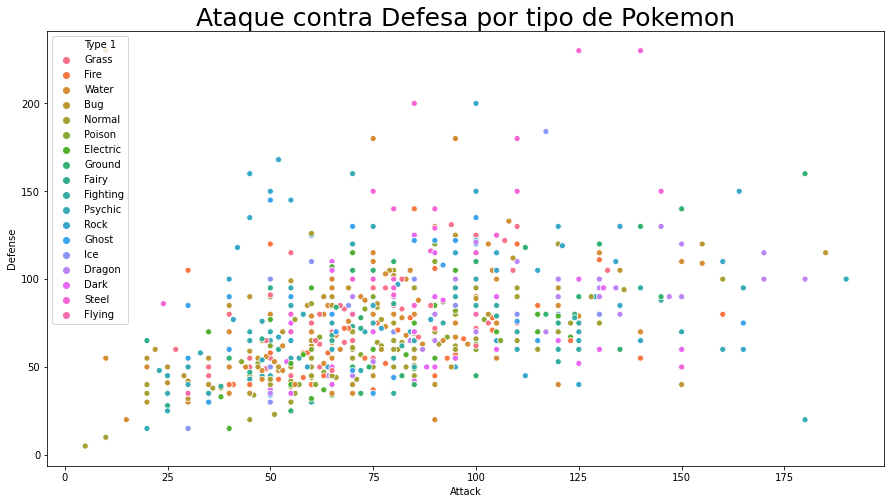

In [26]:
#scatterplot
plt.figure(figsize=(15,8))
ax = sns.scatterplot(x='Attack', y='Defense', data=pokemon, hue='Type 1')
ax.set_title('Ataque contra Defesa por tipo de Pokemon', fontsize= 25, pad=5)
plt.show()

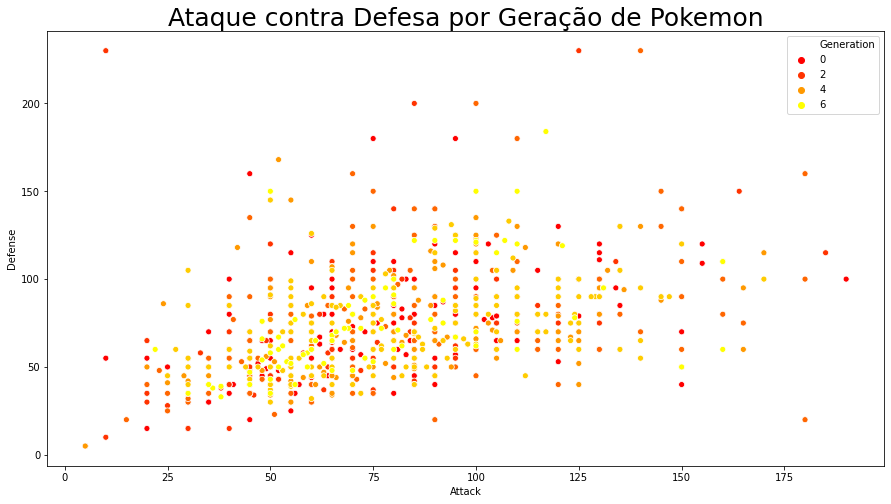

In [29]:
#scatterplot
plt.figure(figsize=(15,8))
ax = sns.scatterplot(x='Attack', y='Defense', data=pokemon, hue='Generation', palette='autumn')
ax.set_title('Ataque contra Defesa por Geração de Pokemon', fontsize= 25, pad=5)
plt.show()

In [31]:
pokemon.head()

,#,Name,Type 1,Type 2,Total,HP,Attack,Defense,Sp. Atk,Sp. Def,Speed,Generation,Legendary
0,1,Bulbasaur,Grass,Poison,318,45,49,49,65,65,45,1,False
1,2,Ivysaur,Grass,Poison,405,60,62,63,80,80,60,1,False
2,3,Venusaur,Grass,Poison,525,80,82,83,100,100,80,1,False
3,3,VenusaurMega Venusaur,Grass,Poison,625,80,100,123,122,120,80,1,False
4,4,Charmander,Fire,NaN,309,39,52,43,60,50,65,1,False


In [32]:
#visualizando informações
pokemon.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 800 entries, 0 to 799
Data columns (total 13 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   #           800 non-null    int64 
 1   Name        800 non-null    object
 2   Type 1      800 non-null    object
 3   Type 2      414 non-null    object
 4   Total       800 non-null    int64 
 5   HP          800 non-null    int64 
 6   Attack      800 non-null    int64 
 7   Defense     800 non-null    int64 
 8   Sp. Atk     800 non-null    int64 
 9   Sp. Def     800 non-null    int64 
 10  Speed       800 non-null    int64 
 11  Generation  800 non-null    int64 
 12  Legendary   800 non-null    bool  
dtypes: bool(1), int64(9), object(3)
memory usage: 75.9+ KB


In [39]:
#preenchendo nulos com uma string
pokemon['Type 2'].fillna('-', inplace=True)

In [40]:
#vendo se temos nulos no dataset
pokemon.isna().sum()

#             0
Name          0
Type 1        0
Type 2        0
Total         0
HP            0
Attack        0
Defense       0
Sp. Atk       0
Sp. Def       0
Speed         0
Generation    0
Legendary     0
dtype: int64

In [42]:
#vendo só os dados com o valor substituido
pokemon.loc[pokemon['Type 2'] == '-'].sample(15)

,#,Name,Type 1,Type 2,Total,HP,Attack,Defense,Sp. Atk,Sp. Def,Speed,Generation,Legendary
469,422,Shellos,Water,-,325,76,48,48,57,62,34,4,False
666,605,Elgyem,Psychic,-,335,55,55,55,85,55,30,5,False
568,509,Purrloin,Dark,-,281,41,50,37,50,37,66,5,False
548,490,Manaphy,Water,-,600,100,100,100,100,100,100,4,False
386,354,Banette,Ghost,-,455,64,115,65,83,63,65,3,False
742,674,Pancham,Fighting,-,348,67,82,62,46,48,43,6,False
645,584,Vanilluxe,Ice,-,535,71,95,85,110,95,79,5,False
592,532,Timburr,Fighting,-,305,75,80,55,25,35,35,5,False
572,513,Pansear,Fire,-,316,50,53,48,53,48,64,5,False
112,104,Cubone,Ground,-,320,50,50,95,40,50,35,1,False


In [43]:
#buscando os Lendários
pokemon.query('Legendary == True')

,#,Name,Type 1,Type 2,Total,HP,Attack,Defense,Sp. Atk,Sp. Def,Speed,Generation,Legendary
156,144,Articuno,Ice,Flying,580,90,85,100,95,125,85,1,True
157,145,Zapdos,Electric,Flying,580,90,90,85,125,90,100,1,True
158,146,Moltres,Fire,Flying,580,90,100,90,125,85,90,1,True
162,150,Mewtwo,Psychic,-,680,106,110,90,154,90,130,1,True
163,150,MewtwoMega Mewtwo X,Psychic,Fighting,780,106,190,100,154,100,130,1,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...
795,719,Diancie,Rock,Fairy,600,50,100,150,100,150,50,6,True
796,719,DiancieMega Diancie,Rock,Fairy,700,50,160,110,160,110,110,6,True
797,720,HoopaHoopa Confined,Psychic,Ghost,600,80,110,60,150,130,70,6,True
798,720,HoopaHoopa Unbound,Psychic,Dark,680,80,160,60,170,130,80,6,True


In [45]:
#fazendo um describe
pokemon[['HP', 'Attack', 'Defense', 'Sp. Atk', 'Sp. Def', 'Speed', 'Total']].describe()


,HP,Attack,Defense,Sp. Atk,Sp. Def,Speed,Total
count,800.000000,800.000000,800.000000,800.000000,800.000000,800.000000,800.00000
mean,69.258750,79.001250,73.842500,72.820000,71.902500,68.277500,435.10250
std,25.534669,32.457366,31.183501,32.722294,27.828916,29.060474,119.96304
min,1.000000,5.000000,5.000000,10.000000,20.000000,5.000000,180.00000
25%,50.000000,55.000000,50.000000,49.750000,50.000000,45.000000,330.00000
50%,65.000000,75.000000,70.000000,65.000000,70.000000,65.000000,450.00000
75%,80.000000,100.000000,90.000000,95.000000,90.000000,90.000000,515.00000
max,255.000000,190.000000,230.000000,194.000000,230.000000,180.000000,780.00000


In [48]:
#qual pokemon tem 1 de HP?
pokemon[pokemon['HP'] == 1]

,#,Name,Type 1,Type 2,Total,HP,Attack,Defense,Sp. Atk,Sp. Def,Speed,Generation,Legendary
316,292,Shedinja,Bug,Ghost,236,1,90,45,30,30,40,3,False


In [50]:

#qual o pokemon com maior HP?
pokemon[pokemon['HP']== 255]

,#,Name,Type 1,Type 2,Total,HP,Attack,Defense,Sp. Atk,Sp. Def,Speed,Generation,Legendary
261,242,Blissey,Normal,-,540,255,10,10,75,135,55,2,False


In [51]:
#qual é o pokemon com maior Total
pokemon[pokemon['Total'] == pokemon['Total'].max()]

,#,Name,Type 1,Type 2,Total,HP,Attack,Defense,Sp. Atk,Sp. Def,Speed,Generation,Legendary
163,150,MewtwoMega Mewtwo X,Psychic,Fighting,780,106,190,100,154,100,130,1,True
164,150,MewtwoMega Mewtwo Y,Psychic,-,780,106,150,70,194,120,140,1,True
426,384,RayquazaMega Rayquaza,Dragon,Flying,780,105,180,100,180,100,115,3,True


In [52]:
#com o menor Total
pokemon[pokemon['Total'] == pokemon['Total'].min()]

,#,Name,Type 1,Type 2,Total,HP,Attack,Defense,Sp. Atk,Sp. Def,Speed,Generation,Legendary
206,191,Sunkern,Grass,-,180,30,30,30,30,30,30,2,False


In [53]:
#qual o pokemon mais mediano (Total)
pokemon[pokemon['Total'] == pokemon['Total'].median()]

,#,Name,Type 1,Type 2,Total,HP,Attack,Defense,Sp. Atk,Sp. Def,Speed,Generation,Legendary
33,28,Sandslash,Ground,-,450,75,100,110,45,55,65,1,False
54,49,Venomoth,Bug,Poison,450,70,65,60,90,75,90,1,False
121,113,Chansey,Normal,-,450,250,5,5,35,105,50,1,False
128,119,Seaking,Water,-,450,80,92,65,65,80,68,1,False
226,210,Granbull,Fairy,-,450,90,120,75,60,60,45,2,False
239,221,Piloswine,Ice,Ground,450,100,100,80,60,60,50,2,False
468,421,Cherrim,Grass,-,450,70,60,70,87,78,85,4,False


In [57]:
#buscando pela moda
pokemon[pokemon['Total'] == pokemon['Total'].mode()[0]]

,#,Name,Type 1,Type 2,Total,HP,Attack,Defense,Sp. Atk,Sp. Def,Speed,Generation,Legendary
102,94,GengarMega Gengar,Ghost,Poison,600,60,65,80,170,95,130,1,False
137,127,PinsirMega Pinsir,Bug,Flying,600,65,155,120,65,90,105,1,False
161,149,Dragonite,Dragon,Flying,600,91,134,95,100,100,80,1,False
165,151,Mew,Psychic,-,600,100,100,100,100,100,100,1,False
229,212,ScizorMega Scizor,Bug,Steel,600,70,150,140,65,100,75,2,False
232,214,HeracrossMega Heracross,Bug,Fighting,600,80,185,115,40,105,75,2,False
248,229,HoundoomMega Houndoom,Dark,Fire,600,75,90,90,140,90,115,2,False
267,248,Tyranitar,Rock,Dark,600,100,134,110,95,100,61,2,False
271,251,Celebi,Psychic,Grass,600,100,100,100,100,100,100,2,False
408,373,Salamence,Dragon,Flying,600,95,135,80,110,80,100,3,False


In [67]:
#vendo a correlação numericamente
corr = pokemon[['Generation','HP', 'Attack', 'Defense', 'Sp. Atk', 'Sp. Def', 'Speed']].corr()
corr

,Generation,HP,Attack,Defense,Sp. Atk,Sp. Def,Speed
Generation,1.000000,0.058683,0.051451,0.042419,0.036437,0.028486,-0.023121
HP,0.058683,1.000000,0.422386,0.239622,0.362380,0.378718,0.175952
Attack,0.051451,0.422386,1.000000,0.438687,0.396362,0.263990,0.381240
Defense,0.042419,0.239622,0.438687,1.000000,0.223549,0.510747,0.015227
Sp. Atk,0.036437,0.362380,0.396362,0.223549,1.000000,0.506121,0.473018
Sp. Def,0.028486,0.378718,0.263990,0.510747,0.506121,1.000000,0.259133
Speed,-0.023121,0.175952,0.381240,0.015227,0.473018,0.259133,1.000000


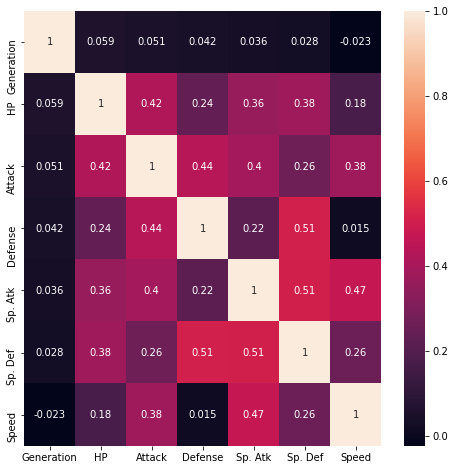

In [68]:
#gerando um heatmap com as variáveis numéricas
plt.figure(figsize=(8,8))
sns.heatmap(corr, annot=True);

In [69]:
#visualizando as colunas
pokemon.columns

Index(['#', 'Name', 'Type 1', 'Type 2', 'Total', 'HP', 'Attack', 'Defense',
       'Sp. Atk', 'Sp. Def', 'Speed', 'Generation', 'Legendary'],
      dtype='object')

In [71]:
#alterando os nomes das colunas
pokemon.columns = ['numero', 'nome','tipo_1',
                'tipo_2', 'total', 'pontos_vida',
                'ataque', 'defesa',
                'ataque_especial', 'defesa_especial',
                'velocidade', 'geracao', 'lendario']

In [72]:
pokemon.head()

,numero,nome,tipo_1,tipo_2,total,pontos_vida,ataque,defesa,ataque_especial,defesa_especial,velocidade,geracao,lendario
0,1,Bulbasaur,Grass,Poison,318,45,49,49,65,65,45,1,False
1,2,Ivysaur,Grass,Poison,405,60,62,63,80,80,60,1,False
2,3,Venusaur,Grass,Poison,525,80,82,83,100,100,80,1,False
3,3,VenusaurMega Venusaur,Grass,Poison,625,80,100,123,122,120,80,1,False
4,4,Charmander,Fire,-,309,39,52,43,60,50,65,1,False


In [74]:
pokemon.tipo_1.unique()

array(['Grass', 'Fire', 'Water', 'Bug', 'Normal', 'Poison', 'Electric',
       'Ground', 'Fairy', 'Fighting', 'Psychic', 'Rock', 'Ghost', 'Ice',
       'Dragon', 'Dark', 'Steel', 'Flying'], dtype=object)

In [75]:
#dataset só com insetos e outro só com os dragões
bug = pokemon[pokemon.tipo_1 == 'Bug']
dragon = pokemon[pokemon['tipo_1'] == 'Dragon']

In [78]:
#vendo o shape
bug.shape, dragon.shape

((69, 13), (32, 13))

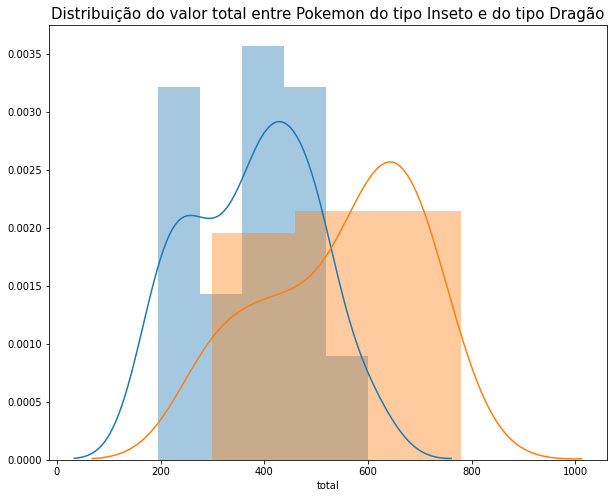

In [82]:
#vendo a distribuição de totais entre insetos e dragões
plt.figure(figsize=(10,8))
plt.title('Distribuição do valor total entre Pokemon do tipo Inseto e do tipo Dragão', fontsize=15)
sns.distplot(bug['total'])
sns.distplot(dragon.total);

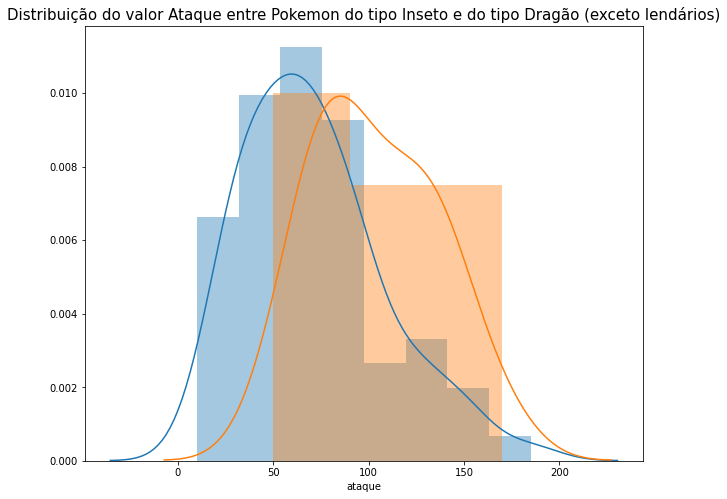

In [87]:
#vendo a distribuição de totais entre insetos e dragões
plt.figure(figsize=(10,8))
plt.title('Distribuição do valor Ataque entre Pokemon do tipo Inseto e do tipo Dragão (exceto lendários)', fontsize=15)
sns.distplot(bug['ataque'])
sns.distplot(dragon.query('lendario == False').ataque);

In [85]:
#separando os lendários
lendario = pokemon[pokemon.lendario == True]
lendario.shape


(65, 13)

In [86]:
lendario.tipo_1.unique()

array(['Ice', 'Electric', 'Fire', 'Psychic', 'Water', 'Rock', 'Steel',
       'Dragon', 'Ground', 'Normal', 'Ghost', 'Dark', 'Grass', 'Flying',
       'Fairy'], dtype=object)

## Rodando o Pandas Profiling

In [89]:
#!pip install -U pandas-profiling


In [90]:
#importando o relatório da biblioteca
from pandas_profiling import ProfileReport

In [91]:
#criando o relatório
profile = ProfileReport(pokemon, explorative=True)

In [93]:
#visualizar dentro do notebook
profile.to_notebook_iframe()

## Tentando definir os Pontos de vida do Pokémon por suas estatísticas de combate

In [94]:
#definindo as variáveis explicativas e a variável alvo
X= pokemon[['ataque','defesa','ataque_especial','defesa_especial','velocidade']]
y = pokemon.pontos_vida

In [95]:
#dividir o dataset entre treino e teste
from sklearn.model_selection import train_test_split

In [96]:
X_train, X_test, y_train, y_test = train_test_split(X,y,random_state=42, test_size= 0.2)

In [101]:
#conferindo o tamanho dos dados de treino
X_train.shape, y_train.shape

((640, 5), (640,))

In [102]:
#confere o tamanho dos dados de teste
X_test.shape, y_test.shape

((160, 5), (160,))

### Usando o Sci-Kit

In [103]:
#importando o modelo e a métrica
from sklearn.metrics import mean_squared_error, r2_score #métrica
from sklearn.linear_model import LinearRegression #modelo

In [107]:
#chamando o modelo
modelo = LinearRegression()

In [108]:
#ajustar o modelo aos dados de treino
modelo.fit(X_train, y_train)

LinearRegression()

In [109]:
#previsão dos dados de teste
y_pred = modelo.predict(X_test)

In [118]:
#avalia o modelo
print(f'O coeficiente de determinação do modelo é : {r2_score(y_test,y_pred)}')
print(f'A média de erros quadrados é de {mean_squared_error(y_test, y_pred).round(2)}')
print(f'5 primeiros valores reais:{y_test[:5].values} ')
print(f'5 primeiros valores previstos:{y_pred[:5].round()} ')

O coeficiente de determinação do modelo é : 0.19481986632489234
A média de erros quadrados é de 463.72
5 primeiros valores reais:[92 75 55 50 65] 
5 primeiros valores previstos:[85. 85. 64. 75. 55.] 


### Usando o Statsmodels

In [119]:
#importando as bibliotecas
import scipy
import statsmodels.api as sm

In [121]:
#criando novo X
x = sm.add_constant(X)

In [122]:
#criando novos dados de treino e teste
x_train, x_test, y_train, y_test = train_test_split(x,y,random_state=42, test_size= 0.2)

In [124]:
#criando um modelo de regressão
regressao = sm.OLS(y_train, x_train, missing='drop').fit()

In [125]:
#visualizando o resultado
print(regressao.summary())

                            OLS Regression Results                            
Dep. Variable:            pontos_vida   R-squared:                       0.290
Model:                            OLS   Adj. R-squared:                  0.285
Method:                 Least Squares   F-statistic:                     51.86
Date:                Sat, 19 Sep 2020   Prob (F-statistic):           4.21e-45
Time:                        23:40:21   Log-Likelihood:                -2880.7
No. Observations:                 640   AIC:                             5773.
Df Residuals:                     634   BIC:                             5800.
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
const              29.9307      3.139     

In [126]:
#pegando as previsões
y_previsto = regressao.predict(x_test)


In [129]:
#avalia o modelo
print(f'O coeficiente de determinação do modelo é : {r2_score(y_test,y_previsto)}')
print(f'A média de erros quadrados é de {mean_squared_error(y_test, y_previsto).round(2)}')
print(f'5 primeiros valores reais:{y_test[:5].values} ')
print(f'5 primeiros valores previstos:{y_previsto[:5].values.round()} ')

O coeficiente de determinação do modelo é : 0.19481986632489356
A média de erros quadrados é de 463.72
5 primeiros valores reais:[92 75 55 50 65] 
5 primeiros valores previstos:[85. 85. 64. 75. 55.] 


### Usando o SciPy para determinar o quanto o ataque explica os pontos de vida

In [138]:
#importando as bibliotecas
from scipy.stats import linregress

In [139]:
slope, intercept, r_value, p_value, std_err = linregress(pokemon.ataque,pokemon.pontos_vida)

In [141]:
print(f'o coeficiente angular da regressão é: {slope}')
print(f'o intercepto da regressão é: {intercept}')
print(f'o valor de r é : {r_value}')
print(f'o p_valor é de: {p_value}')
print(f'o desvio padrão é: {std_err}')

o coeficiente angular da regressão é: 0.3322970660049009
o intercepto da regressão é: 43.00686641428033
o valor de r é : 0.42238602877622305
o p_valor é de: 5.888974358311474e-36
o desvio padrão é: 0.025243123961179944


### $y = a*x + b$

onde $y$ é o valor previsto, $a$ é o coeficiente angular e $b$ é o intercepto

$a$ é a medida da inclinação de uma reta face ao eixo horizontal. Coincide numericamente com a tangente do ângulo formado entre a reta e esse eixo,

$b$ é on de a reta corta o eixo vertical 

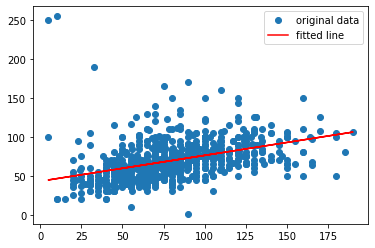

In [142]:
#fazendo o gráfico da reta de regressão
plt.plot(pokemon.ataque, pokemon.pontos_vida, 'o', label='original data')
plt.plot(pokemon.ataque, intercept + slope*pokemon.ataque, 'r', label='fitted line')
plt.legend()
plt.show()

### Entrando com os dois pés na porta (ou, rodando um AutoML)

In [143]:
#importando a biblioteca
from tpot import TPOTRegressor

In [145]:
#criando o AutoML
tpot = TPOTRegressor(generations=20,verbosity=2) #podemos escolher o scoring='r2'

In [146]:
tpot.fit(X,y)


Generation 1 - Current best internal CV score: -437.77566983590276
Generation 2 - Current best internal CV score: -437.77566983590276
Generation 3 - Current best internal CV score: -437.5046570018625
Generation 4 - Current best internal CV score: -435.1208494310989
Generation 5 - Current best internal CV score: -423.0223300611334
Generation 6 - Current best internal CV score: -423.0223300611334
Generation 7 - Current best internal CV score: -423.0223300611334
Generation 8 - Current best internal CV score: -423.0223300611334
Generation 9 - Current best internal CV score: -423.0223300611334
Generation 10 - Current best internal CV score: -423.0223300611334
Generation 11 - Current best internal CV score: -423.0223300611334
Generation 12 - Current best internal CV score: -423.0223300611334
Generation 13 - Current best internal CV score: -417.0995992250343
Generation 14 - Current best internal CV score: -414.26647425
Generation 15 - Current best internal CV score: -414.26647425
Generation 

TPOTRegressor(generations=20,
              log_file=<ipykernel.iostream.OutStream object at 0x7fd4d6479be0>,
              verbosity=2)

In [147]:
tpot.export('modelo_pokemon.py')

In [148]:
#Aplicando o modelo do TPOT
from sklearn.decomposition import PCA
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.pipeline import make_pipeline

# Average CV score on the training set was: -399.68309074999996
exported_pipeline = make_pipeline(
    PCA(iterated_power=1, svd_solver="randomized"),
    ExtraTreesRegressor(bootstrap=False, max_features=0.7500000000000001, min_samples_leaf=1, min_samples_split=2, n_estimators=100)
)

exported_pipeline.fit(X_train, y_train)
results = exported_pipeline.predict(X_test)

In [150]:
#avalia o modelo
print(f'O coeficiente de determinação do modelo é : {r2_score(y_test,results)}')
print(f'A média de erros quadrados é de {mean_squared_error(y_test, results).round(2)}')
print(f'5 primeiros valores reais:{y_test[:5].values} ')
print(f'5 primeiros valores previstos:{results[:5].round()} ')

O coeficiente de determinação do modelo é : 0.27281757944813956
A média de erros quadrados é de 418.8
5 primeiros valores reais:[92 75 55 50 65] 
5 primeiros valores previstos:[86. 81. 64. 50. 57.] 
